<a href="https://colab.research.google.com/github/ahdi3/ComputationalIntelegensiaTask/blob/main/ExamTasks/Animal_Image_Classification_using_AlexNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q kaggle

In [2]:
from google.colab import files
files.upload()

Saving kaggle (2).json to kaggle (2).json


{'kaggle (2).json': b'{"username":"ahdinazzalulahsan","key":"503f4d2cfe638302ace3f91d1ae4fe38"}'}

In [3]:
! mkdir ~/.kaggle

In [4]:
! cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


Download dataset dari website kaggle

In [5]:
!kaggle datasets download -d iamsouravbanerjee/animal-image-dataset-90-different-animals


Dataset URL: https://www.kaggle.com/datasets/iamsouravbanerjee/animal-image-dataset-90-different-animals
License(s): other
 99% 647M/656M [00:08<00:00, 116MB/s]
100% 656M/656M [00:08<00:00, 78.7MB/s]


In [6]:
!unzip /content/animal-image-dataset-90-different-animals.zip

Streaming output truncated to the last 5000 lines.
  inflating: animals/animals/bison/73b10839bc.jpg  
  inflating: animals/animals/bison/74dc1dd32a.jpg  
  inflating: animals/animals/bison/75ab166a7d.jpg  
  inflating: animals/animals/bison/79e1610d01.jpg  
  inflating: animals/animals/bison/7ba5eee91f.jpg  
  inflating: animals/animals/bison/7d214aab4b.jpg  
  inflating: animals/animals/bison/7f2ef9ab03.jpg  
  inflating: animals/animals/bison/82ec723a4f.jpg  
  inflating: animals/animals/bison/85e145af6c.jpg  
  inflating: animals/animals/bison/862e2c6379.jpg  
  inflating: animals/animals/bison/87a5c700ad.jpg  
  inflating: animals/animals/bison/88b723ce90.jpg  
  inflating: animals/animals/bison/8c3af742c3.jpg  
  inflating: animals/animals/bison/8e34044b98.jpg  
  inflating: animals/animals/bison/8e6adbdc40.jpg  
  inflating: animals/animals/bison/8fce80d5ba.jpg  
  inflating: animals/animals/bison/961a895686.jpg  
  inflating: animals/animals/bison/984a5b583d.jpg  
  inflating: 

# import libarary

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from keras.preprocessing.image import load_img

warnings.filterwarnings('ignore')



In [8]:
# Import necessary libraries and modules

import torchvision
import time
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader, random_split
import torchvision.models as models
from sklearn.metrics import classification_report

In [9]:
import os
import pandas as pd

# List untuk menyimpan path gambar dan label
input_path = []  # Menyimpan path gambar
label = []       # Menyimpan label

# Dataset path
dataset_path = "/content/animals/animals"

# Periksa apakah dataset path ada
if not os.path.exists(dataset_path):
    raise FileNotFoundError(f"Dataset path '{dataset_path}' does not exist!")

# Ambil nama subdirektori sebagai nama kelas
class_names = sorted([
    name for name in os.listdir(dataset_path)
    if os.path.isdir(os.path.join(dataset_path, name))
])

# Debug: Tampilkan subdirektori
print("Class names:", class_names)

# Buat dictionary untuk mapping kelas ke label
class_to_label = {class_name: idx for idx, class_name in enumerate(class_names)}

# Iterasi melalui semua kelas dan file
for class_name in class_names:
    class_path = os.path.join(dataset_path, class_name)
    for file_name in os.listdir(class_path):
        file_path = os.path.join(class_path, file_name)
        # Filter hanya file dengan format gambar tertentu
        if os.path.isfile(file_path) and file_name.lower().endswith(('.jpg', '.png', '.jpeg')):
            input_path.append(file_path)               # Tambahkan path gambar
            label.append(class_to_label[class_name])   # Tambahkan label

# Buat DataFrame dari dua list
df = pd.DataFrame({
    "input_path": input_path,
    "label": label
})

# Debug: Tampilkan isi DataFrame
print("DataFrame:")
print(df.head())



Class names: ['antelope', 'badger', 'bat', 'bear', 'bee', 'beetle', 'bison', 'boar', 'butterfly', 'cat', 'caterpillar', 'chimpanzee', 'cockroach', 'cow', 'coyote', 'crab', 'crow', 'deer', 'dog', 'dolphin', 'donkey', 'dragonfly', 'duck', 'eagle', 'elephant', 'flamingo', 'fly', 'fox', 'goat', 'goldfish', 'goose', 'gorilla', 'grasshopper', 'hamster', 'hare', 'hedgehog', 'hippopotamus', 'hornbill', 'horse', 'hummingbird', 'hyena', 'jellyfish', 'kangaroo', 'koala', 'ladybugs', 'leopard', 'lion', 'lizard', 'lobster', 'mosquito', 'moth', 'mouse', 'octopus', 'okapi', 'orangutan', 'otter', 'owl', 'ox', 'oyster', 'panda', 'parrot', 'pelecaniformes', 'penguin', 'pig', 'pigeon', 'porcupine', 'possum', 'raccoon', 'rat', 'reindeer', 'rhinoceros', 'sandpiper', 'seahorse', 'seal', 'shark', 'sheep', 'snake', 'sparrow', 'squid', 'squirrel', 'starfish', 'swan', 'tiger', 'turkey', 'turtle', 'whale', 'wolf', 'wombat', 'woodpecker', 'zebra']
DataFrame:
                                         input_path  la

Kode yang Anda berikan digunakan untuk mengumpulkan path gambar dan label yang sesuai dari folder dataset dan menyimpannya dalam DataFrame untuk memudahkan pemrosesan selanjutnya. Berikut adalah penjelasan langkah demi langkah:

### 1. **Inisialisasi dan Setup**
   - **`input_path = []`** dan **`label = []`**: Dua list kosong yang akan menyimpan path gambar dan label kelas untuk setiap gambar.
   - **`dataset_path = "/content/animals/animals"`**: Menetapkan path dataset di mana gambar disimpan.
   - **`if not os.path.exists(dataset_path): raise FileNotFoundError`**: Memeriksa apakah path dataset ada. Jika tidak ada, program akan memberikan error `FileNotFoundError`.

### 2. **Mendapatkan Nama Kelas**
   - **`class_names = sorted([...])`**: Mengambil semua nama subdirektori (kelas) di dalam folder dataset. `os.listdir` akan mengembalikan daftar semua item dalam direktori, dan `os.path.isdir` memastikan hanya subdirektori yang dipilih. Nama subdirektori ini akan digunakan sebagai nama kelas.
   - **`sorted([...])`**: Menyortir nama kelas agar urut secara alfabet.
   - **`print("Class names:", class_names)`**: Menampilkan nama-nama kelas di dataset untuk debugging.

### 3. **Mapping Nama Kelas ke Label**
   - **`class_to_label = {class_name: idx for idx, class_name in enumerate(class_names)}`**: Membuat dictionary yang memetakan nama kelas ke label numerik. Misalnya, `class_to_label['lion'] = 0`, `class_to_label['tiger'] = 1`, dll.

### 4. **Mengumpulkan Path Gambar dan Label**
   - **Iterasi melalui kelas**: Looping melalui setiap kelas yang ada di dalam `class_names`.
     - **`class_path = os.path.join(dataset_path, class_name)`**: Menentukan path lengkap ke subdirektori kelas.
     - **`for file_name in os.listdir(class_path):`**: Iterasi untuk setiap file di dalam subdirektori kelas.
     - **`file_path = os.path.join(class_path, file_name)`**: Menentukan path lengkap file gambar.
     - **`if os.path.isfile(file_path) and file_name.lower().endswith(('.jpg', '.png', '.jpeg')):`**: Memeriksa apakah file tersebut adalah gambar (memiliki ekstensi `.jpg`, `.png`, atau `.jpeg`).
     - **`input_path.append(file_path)`**: Menambahkan path gambar ke list `input_path`.
     - **`label.append(class_to_label[class_name])`**: Menambahkan label kelas yang sesuai ke list `label`.

### 5. **Membuat DataFrame**
   - **`df = pd.DataFrame({...})`**: Membuat DataFrame dengan dua kolom: `input_path` yang berisi path gambar, dan `label` yang berisi label numerik untuk setiap gambar.
   - **`print("DataFrame:")`** dan **`print(df.head())`**: Menampilkan 5 baris pertama dari DataFrame untuk memverifikasi bahwa data telah berhasil dimuat.

### 6. **Output yang Diharapkan**
   - DataFrame yang dihasilkan akan memiliki dua kolom:
     - **`input_path`**: Menyimpan path file gambar.
     - **`label`**: Menyimpan label numerik yang sesuai dengan kelas gambar.

### 7. **Penggunaan DataFrame**
   - Setelah DataFrame dibuat, Anda bisa menggunakannya untuk proses pelatihan model, seperti menggunakan `input_path` untuk membaca gambar dan `label` untuk melatih model klasifikasi.

Jika Anda ingin memproses gambar untuk pelatihan model, Anda dapat memanfaatkan DataFrame ini untuk membuat dataset yang kompatibel dengan PyTorch atau framework lain yang Anda gunakan.

In [10]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,/content/animals/animals/cockroach/54881690b7.jpg,12
1,/content/animals/animals/goat/532f20fef7.jpg,28
2,/content/animals/animals/dragonfly/6e98c95123.jpg,21
3,/content/animals/animals/squid/49910fd3ff.jpg,78
4,/content/animals/animals/fox/6b0dc9ab1a.jpg,27


In [11]:
for i in df['images']:
  if '.jpg' not in i:
    print(i)


In [12]:
# Hapus semua baris yang mengandung file 'Thumbs.db'
df = df[~df['images'].str.contains('Thumbs.db')]

# Cek panjang dataset setelah penghapusan
print(f"Jumlah data setelah penghapusan: {len(df)}")

Jumlah data setelah penghapusan: 5400


In [13]:

# 2. Cari file yang bermasalah dengan PIL
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)  # Jangan lupa 'PIL.Image.open'
    except:
        l.append(image)

# 3. Hapus file yang ada dalam list `l`
df = df[~df['images'].isin(l)]

# Tampilkan panjang dataset setelah penghapusan
print(f"Jumlah data setelah penghapusan: {len(df)}")


Jumlah data setelah penghapusan: 5400


# Exploratory Data Analysis (EDA)

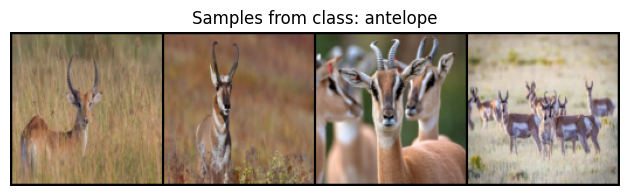

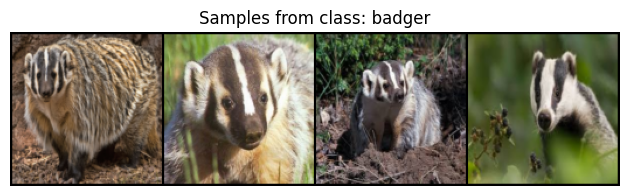

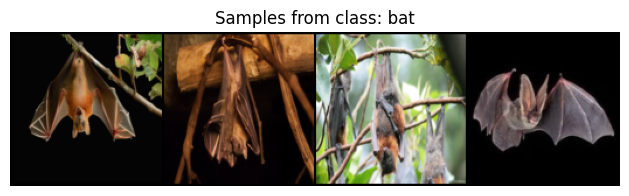

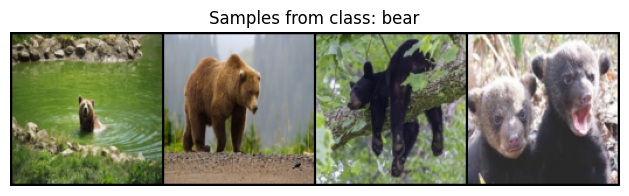

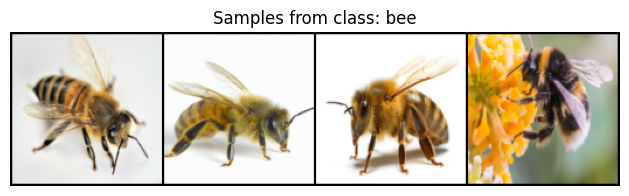

...

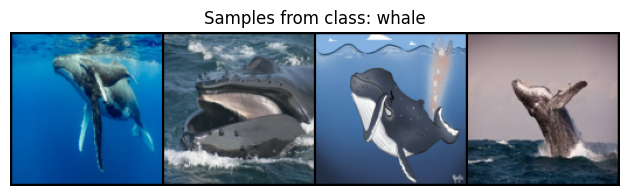

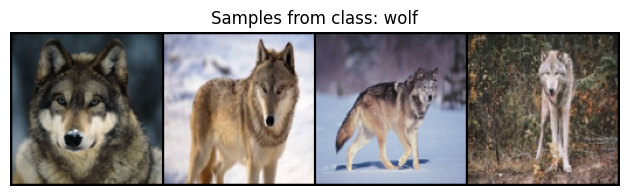

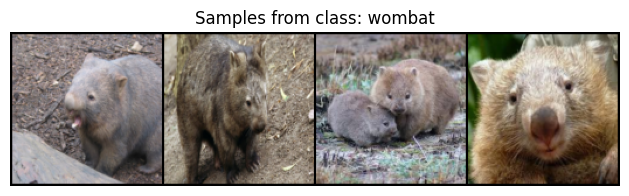

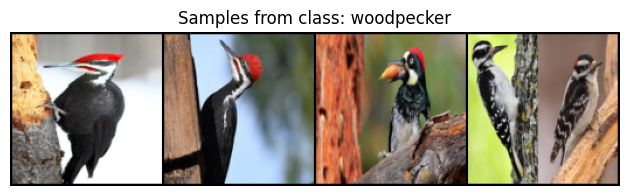

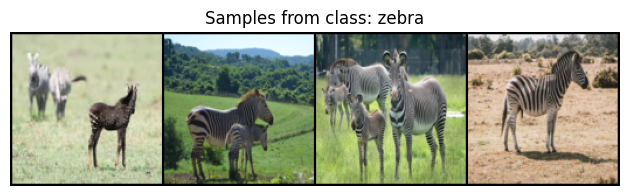

In [14]:
import matplotlib.pyplot as plt
import torchvision
from torchvision import transforms
from PIL import Image

# Fungsi untuk menampilkan sampel gambar dari setiap kelas
def show_samples(input_paths, labels, class_names, num_samples=4, image_size=(128, 128)):
    resize_transform = transforms.Compose([
        transforms.Resize(image_size),  # Atur ukuran gambar
        transforms.ToTensor()          # Konversi gambar ke tensor
    ])

    for class_idx, class_name in enumerate(class_names):
        # Ambil path gambar untuk kelas tertentu
        class_images = [input_paths[i] for i in range(len(labels)) if labels[i] == class_idx][:num_samples]

        # Load dan resize gambar
        images = [resize_transform(Image.open(img).convert("RGB")) for img in class_images]

        # Buat grid gambar
        grid = torchvision.utils.make_grid(images, nrow=num_samples)

        # Tampilkan gambar
        plt.figure(figsize=(10, 2))
        plt.title(f'Samples from class: {class_name}')
        plt.imshow(grid.permute(1, 2, 0))
        plt.axis('off')
        plt.show()

# Pastikan input_path, label, dan class_names sudah terdefinisi
# Misalnya:
# input_path = df['input_path'].tolist()
# labels = df['label'].tolist()
# class_names = ['cat', 'dog', 'bird', ...]

# Panggil fungsi untuk menampilkan sampel
show_samples(input_path, label, class_names, image_size=(128, 128))


Kode ini bertujuan untuk menampilkan sampel gambar dari setiap kelas dalam dataset yang diberikan. Berikut adalah penjelasan fungsi-fungsi utama dalam kode:

1. **`show_samples`**: Fungsi utama ini menerima beberapa parameter:
   - `input_paths`: Daftar path file gambar dalam dataset.
   - `labels`: Daftar label yang menunjukkan kelas setiap gambar.
   - `class_names`: Daftar nama kelas yang ada dalam dataset.
   - `num_samples`: Jumlah gambar yang akan ditampilkan per kelas (default 4).
   - `image_size`: Ukuran gambar yang akan diubah (default 128x128).

2. **Transformasi Gambar**: Menggunakan `transforms.Resize` untuk mengubah ukuran gambar menjadi `image_size`, dan `transforms.ToTensor()` untuk mengonversi gambar ke format tensor yang bisa digunakan dalam model deep learning.

3. **Looping Melalui Kelas**:
   - Untuk setiap kelas, kode ini mencari gambar dengan label yang sesuai dan mengambil sejumlah sampel (dalam hal ini 4 gambar per kelas).
   - Setiap gambar di-load dan diubah ukurannya menggunakan transformasi yang sudah didefinisikan.

4. **Membuat Grid Gambar**:
   - Gambar yang telah diubah ukurannya disusun dalam bentuk grid menggunakan `torchvision.utils.make_grid`, yang memudahkan untuk melihat beberapa gambar dalam satu tampilan.

5. **Menampilkan Gambar**:
   - Gambar ditampilkan menggunakan `matplotlib.pyplot.imshow`. Setiap grid gambar diberi judul sesuai dengan kelas dan ditampilkan tanpa sumbu (axis).

Kode ini berguna untuk memvisualisasikan sampel gambar dari dataset yang memiliki beberapa kelas, sehingga memudahkan pengguna untuk melihat data yang digunakan dalam tugas klasifikasi.

In [15]:
# Define transformations with augmentations
transform = transforms.Compose([
    transforms.Resize((227, 227)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the dataset with ImageFolder and apply transformations
dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
class_names = dataset.classes
num_images = len(dataset)  # Get the total number of images

# Calculate the total images per class
class_counts = {class_name: 0 for class_name in class_names}
for target in dataset.targets:
    class_counts[class_names[target]] += 1

# Print the classes, total number of images, and count per class
print(f"Classes: {class_names}")
print(f"Total number of images: {num_images}")
print("Images per class:")
for class_name, count in class_counts.items():
    print(f"  {class_name}: {count}")


Classes: ['antelope', 'badger', 'bat', 'bear', 'bee', 'beetle', 'bison', 'boar', 'butterfly', 'cat', 'caterpillar', 'chimpanzee', 'cockroach', 'cow', 'coyote', 'crab', 'crow', 'deer', 'dog', 'dolphin', 'donkey', 'dragonfly', 'duck', 'eagle', 'elephant', 'flamingo', 'fly', 'fox', 'goat', 'goldfish', 'goose', 'gorilla', 'grasshopper', 'hamster', 'hare', 'hedgehog', 'hippopotamus', 'hornbill', 'horse', 'hummingbird', 'hyena', 'jellyfish', 'kangaroo', 'koala', 'ladybugs', 'leopard', 'lion', 'lizard', 'lobster', 'mosquito', 'moth', 'mouse', 'octopus', 'okapi', 'orangutan', 'otter', 'owl', 'ox', 'oyster', 'panda', 'parrot', 'pelecaniformes', 'penguin', 'pig', 'pigeon', 'porcupine', 'possum', 'raccoon', 'rat', 'reindeer', 'rhinoceros', 'sandpiper', 'seahorse', 'seal', 'shark', 'sheep', 'snake', 'sparrow', 'squid', 'squirrel', 'starfish', 'swan', 'tiger', 'turkey', 'turtle', 'whale', 'wolf', 'wombat', 'woodpecker', 'zebra']
Total number of images: 5400
Images per class:
  antelope: 60
  badger

Kode ini bertujuan untuk memuat dataset gambar dari folder, menerapkan transformasi data dengan augmentasi, dan menghitung serta menampilkan informasi tentang dataset tersebut. Berikut adalah penjelasan lebih rinci tentang tiap bagian:

1. **Transformasi Gambar dengan Augmentasi**:
   - **`transforms.Resize((227, 227))`**: Mengubah ukuran gambar menjadi 227x227 piksel.
   - **`transforms.RandomHorizontalFlip()`**: Melakukan flip horizontal secara acak pada gambar, yang merupakan bentuk augmentasi data untuk meningkatkan variasi dalam dataset.
   - **`transforms.RandomRotation(10)`**: Memutar gambar secara acak hingga 10 derajat, lagi-lagi sebagai augmentasi untuk membantu model lebih robust terhadap variasi sudut.
   - **`transforms.ToTensor()`**: Mengubah gambar menjadi tensor, format yang digunakan oleh model deep learning.
   - **`transforms.Normalize(mean, std)`**: Menormalkan gambar dengan rata-rata dan standar deviasi yang diberikan (nilai ini sering digunakan pada dataset ImageNet).

2. **Memuat Dataset dengan `ImageFolder`**:
   - **`datasets.ImageFolder(root=dataset_path, transform=transform)`**: Menggunakan `ImageFolder` dari `torchvision.datasets` untuk memuat dataset gambar yang terorganisir dalam folder berdasarkan kelas (misalnya, setiap subfolder berisi gambar dari kelas tertentu). Dataset ini juga diberi transformasi yang sudah didefinisikan sebelumnya.

3. **Mengambil Kelas dan Menghitung Jumlah Gambar**:
   - **`dataset.classes`**: Mengambil nama kelas dari dataset (misalnya, `['cats', 'dogs']`).
   - **`len(dataset)`**: Mendapatkan jumlah total gambar dalam dataset.

4. **Menghitung Jumlah Gambar per Kelas**:
   - Membuat dictionary `class_counts` untuk menghitung jumlah gambar per kelas.
   - **`dataset.targets`**: Mengambil label target untuk setiap gambar (indeks kelas).
   - Setiap kali menemukan target (label), kode ini menambah jumlah gambar untuk kelas yang sesuai.

5. **Menampilkan Informasi Dataset**:
   - Mencetak nama kelas, jumlah total gambar dalam dataset, dan jumlah gambar per kelas.

Secara keseluruhan, kode ini melakukan preprocessing dataset gambar, menerapkan augmentasi untuk meningkatkan keragaman data, dan memberikan statistik dasar tentang dataset, seperti jumlah gambar dan distribusi gambar berdasarkan kelas.

# Split the Dataset

In [16]:
# Step 2: Split the dataset into training and testing sets
# Allocate 80% for training and 20% for testing
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# Create data loaders for training and testing
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

Kode ini bertujuan untuk membagi dataset menjadi dua bagian (training dan testing), serta membuat DataLoader untuk memuat data dalam batch selama pelatihan dan pengujian model. Berikut adalah penjelasan rinci tentang setiap bagian:

1. **Membagi Dataset menjadi Training dan Testing**:
   - **`train_size = int(0.8 * len(dataset))`**: Menghitung jumlah data untuk set pelatihan dengan mengambil 80% dari total dataset.
   - **`test_size = len(dataset) - train_size`**: Menghitung jumlah data untuk set pengujian dengan mengambil sisa dataset (20%).
   - **`train_dataset, test_dataset = random_split(dataset, [train_size, test_size])`**: Membagi dataset menjadi dua bagian: satu untuk pelatihan (`train_dataset`) dan satu untuk pengujian (`test_dataset`) menggunakan fungsi `random_split` dari PyTorch. Fungsi ini akan secara acak membagi dataset sesuai dengan ukuran yang sudah ditentukan.

2. **Membuat DataLoader untuk Training dan Testing**:
   - **`train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)`**: Membuat `DataLoader` untuk set pelatihan. `batch_size=32` berarti setiap iterasi akan memuat 32 gambar, dan `shuffle=True` memastikan bahwa data diacak sebelum setiap epoch, yang membantu mengurangi overfitting dan meningkatkan generalisasi model.
   - **`test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)`**: Membuat `DataLoader` untuk set pengujian. Di sini, `shuffle=False` karena pengujian tidak memerlukan pengacakan, sehingga urutan data tetap konsisten saat menguji model.

Secara keseluruhan, kode ini membagi dataset menjadi dua subset (training dan testing) dan membuat `DataLoader` untuk masing-masing subset untuk mempermudah pemrosesan data dalam batch saat pelatihan dan pengujian model deep learning.

In [17]:
# Tentukan device (CPU/GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create the Model: AlexNet

In [18]:
# Step 3: Load a pretrained AlexNet model and prepare it for transfer learning
# Freeze feature extractor layers and modify output layer for 2 classes
model = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)
for param in model.features.parameters():
    param.requires_grad = False  # Freeze the feature extractor layers
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(class_names))  # Adjust output layer for 2 classes
model = model.to(device)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 108MB/s]


Kode ini bertujuan untuk mempersiapkan model **AlexNet** yang telah dilatih sebelumnya (pretrained) untuk digunakan dalam tugas transfer learning, serta menyesuaikan beberapa bagian dari model agar sesuai dengan jumlah kelas dalam dataset. Berikut penjelasan lebih rinci tentang setiap bagian:

1. **Memuat Model AlexNet yang Sudah Ditraining**:
   - **`model = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)`**: Memuat model **AlexNet** yang sudah dilatih dengan bobot default (pretrained) yang tersedia di PyTorch. Model ini sudah dilatih menggunakan dataset ImageNet dan sudah memiliki kemampuan ekstraksi fitur yang baik.

2. **Membekukan (Freeze) Lapisan Ekstraktor Fitur**:
   - **`for param in model.features.parameters(): param.requires_grad = False`**: Kode ini membekukan (freeze) lapisan-lapisan ekstraktor fitur pada model AlexNet. Artinya, parameter-parameter pada bagian `features` (bagian pertama dari model yang bertanggung jawab untuk ekstraksi fitur) tidak akan diperbarui selama proses pelatihan. Ini dilakukan untuk mempertahankan pengetahuan yang sudah dipelajari dari dataset ImageNet dan hanya melatih lapisan output yang disesuaikan dengan dataset baru.

3. **Menyesuaikan Lapisan Output (Classifier)**:
   - **`model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(class_names))`**: Model AlexNet memiliki lapisan `classifier` yang terdiri dari beberapa lapisan fully connected. Baris ini mengganti lapisan terakhir (`classifier[6]`) agar jumlah unit outputnya sesuai dengan jumlah kelas dalam dataset yang baru. `model.classifier[6].in_features` adalah jumlah input ke lapisan terakhir, dan `len(class_names)` adalah jumlah kelas dalam dataset. Dengan cara ini, model akan menghasilkan output sesuai dengan jumlah kelas dalam dataset baru, misalnya 2 kelas jika `class_names` berisi 2 kelas.

4. **Memindahkan Model ke Device (GPU/CPU)**:
   - **`model = model.to(device)`**: Model kemudian dipindahkan ke perangkat yang sesuai (`device`), apakah itu GPU atau CPU, berdasarkan preferensi atau ketersediaan perangkat keras. `device` di sini adalah variabel yang mengacu pada perangkat, misalnya `cuda` (GPU) atau `cpu`.

Secara keseluruhan, kode ini mengatur **AlexNet** yang sudah dilatih sebelumnya untuk transfer learning, dengan membekukan bagian ekstraktor fitur dan hanya melatih lapisan output yang baru disesuaikan agar sesuai dengan jumlah kelas pada dataset yang sedang digunakan. Ini adalah teknik umum dalam transfer learning untuk memanfaatkan model yang sudah dilatih dengan dataset besar dan mengadaptasinya untuk tugas yang lebih spesifik.

In [19]:
# Step 4: Define the loss function, optimizer, and learning rate scheduler
# CrossEntropyLoss for classification, Adam optimizer, and StepLR scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)  # Reduce LR by 10x every 3 epochs

Kode ini bertujuan untuk mendefinisikan fungsi kerugian (loss function), optimisasi, dan pengatur jadwal laju pembelajaran (learning rate scheduler) untuk pelatihan model. Berikut adalah penjelasan setiap bagiannya:

1. **Definisi Fungsi Kerugian (Loss Function)**:
   - **`criterion = nn.CrossEntropyLoss()`**: Fungsi kerugian yang digunakan adalah **CrossEntropyLoss**, yang umum digunakan dalam masalah klasifikasi. Fungsi ini menghitung selisih antara prediksi model dan label target dalam klasifikasi multi-kelas. Cross-entropy loss mengukur seberapa baik distribusi probabilitas yang diprediksi oleh model sesuai dengan distribusi probabilitas label yang sebenarnya.

2. **Definisi Optimizer**:
   - **`optimizer = optim.Adam(model.parameters(), lr=0.001)`**: Optimizer yang digunakan adalah **Adam** (Adaptive Moment Estimation), yang sangat populer karena kemampuannya untuk mengatur laju pembelajaran secara otomatis berdasarkan rata-rata gradien dan kuadrat gradien. `model.parameters()` merujuk pada parameter-parameter model yang akan diperbarui selama pelatihan. Laju pembelajaran (`lr=0.001`) mengatur seberapa besar langkah yang diambil dalam pembaruan parameter.

3. **Definisi Learning Rate Scheduler**:
   - **`scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)`**: Learning rate scheduler ini digunakan untuk mengurangi laju pembelajaran secara bertahap selama pelatihan. `StepLR` akan mengurangi laju pembelajaran (learning rate) sebesar faktor `gamma` setiap `step_size` epoch. Dalam hal ini, laju pembelajaran akan dikurangi sebanyak 10 kali (`gamma=0.1`) setiap 3 epoch (`step_size=3`). Ini membantu model untuk melakukan konvergensi lebih halus setelah beberapa epoch pelatihan.

Secara keseluruhan, kode ini mengonfigurasi aspek-aspek utama yang diperlukan untuk pelatihan model, yaitu:
- **CrossEntropyLoss** sebagai fungsi kerugian untuk klasifikasi,
- **Adam optimizer** untuk memperbarui bobot model dengan laju pembelajaran 0.001, dan
- **StepLR scheduler** untuk mengurangi laju pembelajaran setiap 3 epoch dengan faktor 0.1, yang dapat membantu model belajar lebih stabil dan menghindari overshooting pada fase akhir pelatihan.

# Train the Model

Epoch [1/10], Loss: 2.5781, Time: 361.43s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [2/10], Loss: 1.8407, Time: 355.33s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [3/10], Loss: 1.6457, Time: 360.55s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [4/10], Loss: 0.9226, Time: 355.86s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [5/10], Loss: 0.6822, Time: 389.69s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [6/10], Loss: 0.5904, Time: 459.67s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [7/10], Loss: 0.5214, Time: 440.31s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [8/10], Loss: 0.4977, Time: 450.46s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [9/10], Loss: 0.4791, Time: 447.44s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [10/10], Loss: 0.4691, Time: 436.68s
Best model saved to /kaggle/working/best_animal_model.pth

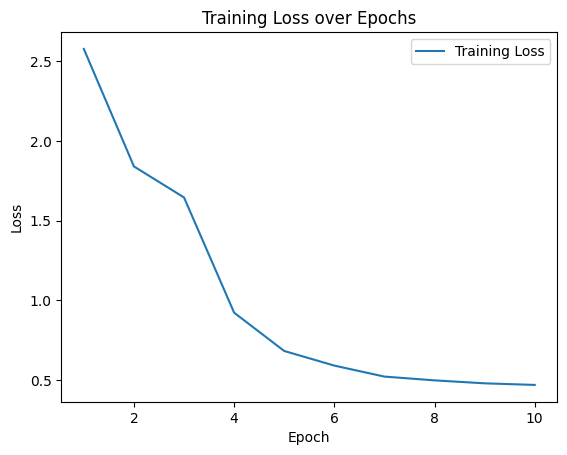

In [21]:
# Step 5: Train the model and save the best-performing model based on validation loss
num_epochs = 10
best_loss = float('inf')
# Path untuk menyimpan model terbaik
best_model_path = "/kaggle/working/best_animal_model.pth"
# Pastikan direktori ada
os.makedirs(os.path.dirname(best_model_path), exist_ok=True)
# List to store loss for each epoch
training_losses = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    start_time = time.time()

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        # Zero the parameter gradients, forward pass, backward pass, and optimization
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    end_time = time.time()
    epoch_duration = end_time - start_time
    avg_loss = running_loss / len(train_loader)
    # Append average loss for current epoch
    training_losses.append(avg_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, Time: {epoch_duration:.2f}s")

    # Save the model if it has the lowest loss so far
    if avg_loss < best_loss:
        best_loss = avg_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved to {best_model_path}")

    # Update the learning rate
    scheduler.step()


# Plotting training loss after training loop is complete
plt.figure()
plt.plot(range(1, num_epochs+1), training_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss over Epochs")
plt.legend()
plt.show()

Kode ini bertujuan untuk melatih model menggunakan data pelatihan (training) selama beberapa epoch, serta menyimpan model terbaik berdasarkan nilai kerugian validasi (validation loss). Berikut adalah penjelasan setiap bagian dalam kode ini:

### 1. **Inisialisasi Parameter dan Setup**
   - **`num_epochs = 10`**: Menetapkan jumlah epoch (iterasi penuh pada dataset) untuk pelatihan.
   - **`best_loss = float('inf')`**: Menyimpan nilai kerugian terbaik yang pernah dicapai selama pelatihan. Awalnya diset ke nilai tak terbatas untuk memastikan bahwa setiap kerugian lebih baik akan diupdate.
   - **`best_model_path`**: Menentukan path untuk menyimpan model terbaik.
   - **`os.makedirs`**: Membuat direktori untuk menyimpan model terbaik, jika belum ada.
   - **`training_losses`**: Daftar untuk menyimpan nilai rata-rata kerugian setiap epoch.

### 2. **Loop untuk Pelatihan (Training) Model**
   - Loop ini berjalan selama `num_epochs`.
   - Untuk setiap epoch:
     - Model diatur ke mode pelatihan (`model.train()`).
     - **`running_loss`**: Menyimpan total kerugian untuk epoch ini.
     - **`start_time`**: Waktu awal untuk mengukur durasi epoch.
     
     - **Iterasi di atas DataLoader untuk mendapatkan batch input dan label**:
       - Memindahkan data ke device (CPU atau GPU) menggunakan `inputs.to(device)` dan `labels.to(device)`.
       - Menghitung output model dan nilai kerugian (`loss = criterion(outputs, labels)`).
       - Melakukan backpropagation (`loss.backward()`) dan update bobot model (`optimizer.step()`).
       - Menambahkan nilai kerugian ke `running_loss`.

     - **Hitung waktu yang dibutuhkan untuk epoch**:
       - **`end_time`**: Waktu akhir setelah epoch selesai.
       - **`epoch_duration`**: Durasi epoch dalam detik.

     - **Hitung rata-rata kerugian untuk epoch ini** (`avg_loss`).
     - Simpan rata-rata kerugian ke dalam daftar (`training_losses`).

     - **Cetak laporan untuk epoch ini**:
       - Menampilkan rata-rata kerugian, serta durasi epoch.

     - **Simpan model terbaik berdasarkan kerugian terendah**:
       - Jika rata-rata kerugian (`avg_loss`) lebih rendah dari `best_loss`, maka simpan model ke file (`best_model_path`).

     - **Update laju pembelajaran menggunakan Scheduler**:
       - Memanggil `scheduler.step()` untuk memperbarui laju pembelajaran sesuai jadwal yang telah ditentukan (misalnya, mengurangi laju pembelajaran setiap beberapa epoch).

### 3. **Plotting Kerugian Training Setelah Loop Training Selesai**
   - Setelah loop pelatihan selesai, kode ini membuat plot untuk menunjukkan kerugian training selama epoch.
   - **`plt.figure()`**: Membuat gambar baru.
   - **`plt.plot()`**: Mentransfer data `training_losses` ke plot.
   - Menampilkan plot dengan judul "Training Loss over Epochs".

### Kesimpulan:
Secara keseluruhan, kode ini melatih model pada data pelatihan selama sejumlah epoch yang telah ditentukan, menyimpan model terbaik berdasarkan kerugian yang dicapai, dan memplot kerugian rata-rata setelah proses pelatihan selesai. Model yang disimpan adalah yang memiliki nilai rata-rata kerugian terbaik selama proses pelatihan.

Epoch [1/10], Accuracy: 84.72%, Time: 436.96s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [2/10], Accuracy: 86.39%, Time: 447.04s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [3/10], Accuracy: 85.86%, Time: 442.12s
Epoch [4/10], Accuracy: 85.62%, Time: 434.04s
Epoch [5/10], Accuracy: 86.92%, Time: 433.86s
Best model saved to /kaggle/working/best_animal_model.pth
Epoch [6/10], Accuracy: 85.44%, Time: 434.13s
Epoch [7/10], Accuracy: 85.95%, Time: 435.52s
Epoch [8/10], Accuracy: 85.69%, Time: 436.64s
Epoch [9/10], Accuracy: 85.86%, Time: 435.60s
Epoch [10/10], Accuracy: 86.00%, Time: 435.94s


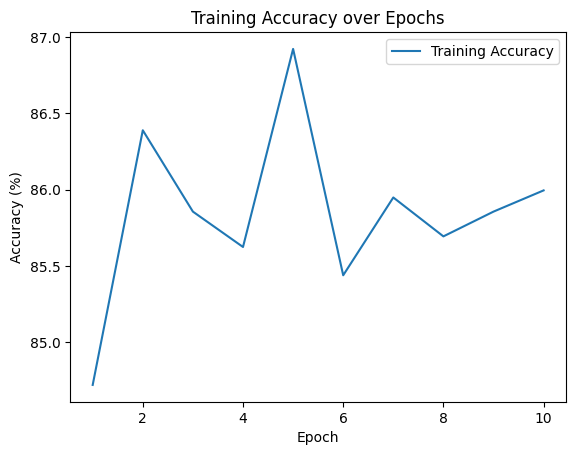

In [22]:
import torch
import os
import time
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

# Other necessary imports like your model, criterion, optimizer, etc.

# Step 5: Train the model and save the best-performing model based on validation accuracy
num_epochs = 10
best_accuracy = 0.0
# Path untuk menyimpan model terbaik
best_model_path = "/kaggle/working/best_animal_model.pth"
# Pastikan direktori ada
os.makedirs(os.path.dirname(best_model_path), exist_ok=True)
# List to store accuracy for each epoch
training_accuracies = []

# Assuming device, model, optimizer, criterion, and train_loader are defined
for epoch in range(num_epochs):
    model.train()
    correct = 0
    total = 0
    start_time = time.time()

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        # Zero the parameter gradients, forward pass, backward pass, and optimization
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Calculate accuracy
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    # Compute accuracy
    accuracy = 100 * correct / total
    training_accuracies.append(accuracy)

    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch [{epoch+1}/{num_epochs}], Accuracy: {accuracy:.2f}%, Time: {epoch_duration:.2f}s")

    # Save the model if it has the highest accuracy so far
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved to {best_model_path}")

    # Update the learning rate
    scheduler.step()

# Plotting training accuracy after training loop is complete
plt.figure()
plt.plot(range(1, num_epochs+1), training_accuracies, label="Training Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Training Accuracy over Epochs")
plt.legend()
plt.show()


Kode ini bertujuan untuk melatih model dan menyimpan model terbaik berdasarkan akurasi validasi tertinggi yang dicapai selama pelatihan. Berikut adalah penjelasan rinci tentang setiap bagian dalam kode:

### 1. **Inisialisasi Parameter dan Setup**
   - **`num_epochs = 10`**: Menetapkan jumlah epoch untuk pelatihan, yaitu sebanyak 10 epoch.
   - **`best_accuracy = 0.0`**: Menyimpan akurasi tertinggi yang tercapai selama pelatihan. Dimulai dari 0 untuk memastikan bahwa akurasi pertama yang tercapai lebih tinggi dari nilai ini.
   - **`best_model_path`**: Menentukan lokasi file untuk menyimpan model terbaik berdasarkan akurasi tertinggi.
   - **`os.makedirs`**: Membuat direktori untuk menyimpan model jika belum ada.
   - **`training_accuracies`**: Daftar untuk menyimpan akurasi rata-rata per epoch selama pelatihan.

### 2. **Loop Pelatihan (Training)**
   - Loop ini berjalan selama `num_epochs` dan melatih model pada dataset.
   
   **Untuk setiap epoch**:
   - **`model.train()`**: Mengatur model ke mode pelatihan (training).
   - **`correct = 0` dan `total = 0`**: Menyimpan jumlah prediksi yang benar dan total data untuk menghitung akurasi di akhir epoch.
   - **`start_time`**: Waktu mulai untuk mengukur durasi epoch.
   
   - **Loop melalui DataLoader untuk mendapatkan batch input dan label**:
     - **`inputs, labels = inputs.to(device), labels.to(device)`**: Memindahkan input dan label ke perangkat yang sesuai (CPU atau GPU).
     - Melakukan forward pass (`outputs = model(inputs)`), menghitung loss (`loss = criterion(outputs, labels)`), dan melakukan backward pass untuk update bobot (`loss.backward()`) serta optimisasi (`optimizer.step()`).
   
   - **Menghitung akurasi**:
     - **`_, predicted = torch.max(outputs, 1)`**: Mengambil label prediksi dengan nilai probabilitas tertinggi untuk setiap data.
     - **`correct += (predicted == labels).sum().item()`**: Menambahkan jumlah prediksi yang benar.
     - **`total += labels.size(0)`**: Menambahkan jumlah total data pada batch.
   
   - **Menghitung akurasi (%)**:
     - **`accuracy = 100 * correct / total`**: Menghitung persentase akurasi.
     - Menyimpan akurasi untuk setiap epoch dalam `training_accuracies`.

   - **Menghitung waktu untuk epoch ini** (`epoch_duration`).
   - **Mencetak laporan untuk epoch ini**: Menampilkan akurasi dan durasi epoch.

### 3. **Menyimpan Model Terbaik**
   - **`if accuracy > best_accuracy`**: Jika akurasi pada epoch ini lebih tinggi dari akurasi terbaik sebelumnya:
     - Update `best_accuracy` dan simpan model terbaik menggunakan `torch.save`.
     - Menyimpan model dengan nama file yang telah ditentukan (`best_model_path`).

### 4. **Update Learning Rate**
   - **`scheduler.step()`**: Mengupdate laju pembelajaran menggunakan scheduler yang telah didefinisikan sebelumnya. Scheduler ini dapat digunakan untuk mengurangi laju pembelajaran pada interval tertentu, misalnya setiap beberapa epoch.

### 5. **Plotting Akurasi Training**
   - Setelah pelatihan selesai, kode ini membuat plot yang menunjukkan perkembangan akurasi selama setiap epoch.
   - **`plt.plot(range(1, num_epochs+1), training_accuracies)`**: Memplot akurasi yang tercatat untuk setiap epoch.
   - Menampilkan plot dengan label, judul, dan legenda yang sesuai.

### Kesimpulan:
Secara keseluruhan, kode ini melatih model menggunakan dataset yang diberikan selama beberapa epoch, menghitung akurasi pada setiap epoch, dan menyimpan model terbaik berdasarkan akurasi tertinggi yang dicapai selama pelatihan. Pada akhirnya, kode ini juga memplot akurasi selama epoch untuk memberikan gambaran visual tentang bagaimana model belajar dan meningkatkan kinerjanya seiring berjalannya waktu.

# Evaluate the Model

In [24]:
# Step 6: Load the best model for evaluation
model.load_state_dict(torch.load('/kaggle/working/best_animal_model.pth', map_location=device))
# print(f"Best model loaded from {best_model_path}")

<All keys matched successfully>

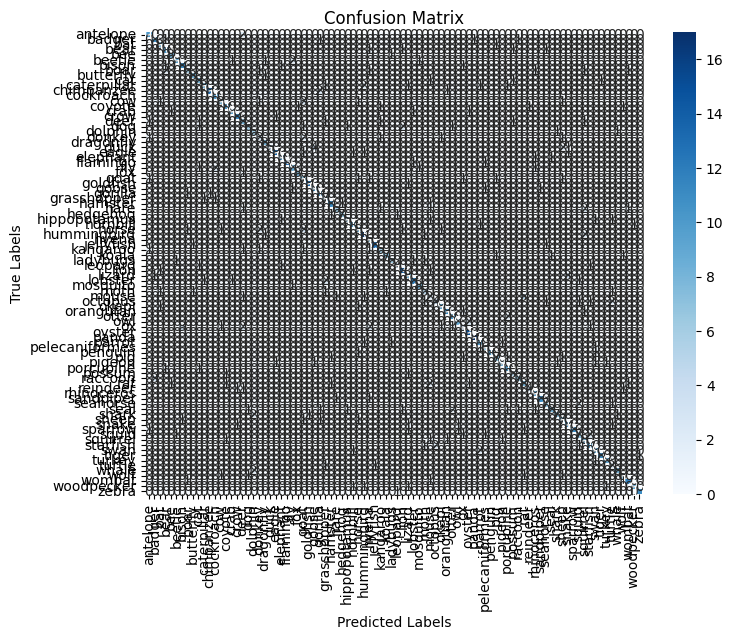

In [25]:
# Step 7: Evaluate the model on the test set, gather predictions, and print confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Calculate and plot the confusion matrix
conf_matrix = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

Kode ini bertujuan untuk mengevaluasi kinerja model pada set pengujian (test set) dan menghasilkan matriks kebingungannya (confusion matrix) yang digunakan untuk menganalisis prediksi model dibandingkan dengan label asli (ground truth). Berikut penjelasan rinci tentang setiap langkah:

### 1. **Setel Model ke Mode Evaluasi**
   - **`model.eval()`**: Mengatur model ke mode evaluasi. Ini penting karena beberapa layer seperti dropout atau batch normalization berfungsi berbeda pada mode pelatihan dan evaluasi.

### 2. **Inisialisasi Variabel untuk Menyimpan Prediksi dan Label**
   - **`all_preds = []`**: Daftar kosong untuk menyimpan prediksi dari model.
   - **`all_labels = []`**: Daftar kosong untuk menyimpan label asli (ground truth) dari dataset pengujian.

### 3. **Loop Pengujian Tanpa Gradien**
   - **`with torch.no_grad()`**: Memastikan bahwa selama evaluasi, PyTorch tidak menghitung gradien, sehingga proses ini lebih cepat dan menghemat memori.
   
   - **Loop melalui `test_loader`**:
     - **`inputs, labels = inputs.to(device), labels.to(device)`**: Memindahkan input dan label ke perangkat yang sesuai (GPU atau CPU).
     - **`outputs = model(inputs)`**: Melakukan prediksi dengan model.
     - **`_, preds = torch.max(outputs, 1)`**: Mengambil prediksi kelas dengan probabilitas tertinggi (nilai terbesar dalam output model).
     - **`all_preds.extend(preds.cpu().numpy())`**: Menambahkan prediksi ke dalam list `all_preds`. `preds.cpu().numpy()` digunakan untuk mengubah tensor menjadi array NumPy yang bisa diproses lebih lanjut.
     - **`all_labels.extend(labels.cpu().numpy())`**: Menambahkan label asli ke dalam list `all_labels`.

### 4. **Menghitung dan Menampilkan Matriks Kebingungannya**
   - **`conf_matrix = confusion_matrix(all_labels, all_preds)`**: Menggunakan fungsi `confusion_matrix` dari scikit-learn untuk menghitung matriks kebingungannya, yang menunjukkan jumlah prediksi yang benar dan salah untuk setiap kelas.
   
   - **Plotting Matriks Kebingungan**:
     - **`plt.figure(figsize=(8, 6))`**: Menentukan ukuran gambar plot.
     - **`sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)`**: Menggunakan seaborn untuk membuat heatmap dari matriks kebingungannya.
       - **`annot=True`**: Menambahkan angka pada setiap sel heatmap.
       - **`fmt='d'`**: Menyatakan bahwa angka yang ditampilkan adalah integer (digunakan untuk nilai prediksi dan label yang berupa integer).
       - **`cmap='Blues'`**: Menentukan skema warna biru untuk heatmap.
       - **`xticklabels=class_names, yticklabels=class_names`**: Menambahkan nama kelas di sumbu x dan y berdasarkan `class_names`.
   
   - **`plt.xlabel('Predicted Labels')`** dan **`plt.ylabel('True Labels')`**: Menambahkan label untuk sumbu x dan y.
   - **`plt.title('Confusion Matrix')`**: Menambahkan judul plot.
   - **`plt.show()`**: Menampilkan heatmap.

### Tujuan dan Hasil
- **Matriks Kebingungannya**: Matriks ini menunjukkan jumlah prediksi yang benar dan salah per kelas. Baris mewakili label asli (ground truth), sedangkan kolom mewakili prediksi model.
  - **Diagonal utama** (dari kiri atas ke kanan bawah) menunjukkan prediksi yang benar untuk setiap kelas.
  - **Sel di luar diagonal utama** menunjukkan kesalahan prediksi, yaitu prediksi yang salah untuk kelas yang berbeda.

### Kesimpulan
Dengan melihat matriks kebingungan, Anda dapat mengevaluasi kinerja model secara lebih mendalam, memahami kelas mana yang lebih sulit untuk diprediksi dengan benar, dan melihat apakah ada ketidakseimbangan dalam prediksi antara kelas-kelas tertentu.

Accuracy: 0.7203703703703703
Precision (per class): [0.75       0.76923077 0.72727273 0.625      0.88888889 0.88888889
 0.70588235 0.66666667 0.81818182 0.75       0.71428571 0.85714286
 0.83333333 0.6        0.76923077 0.66666667 0.81818182 0.55555556
 0.66666667 0.45454545 0.36363636 0.8        0.66666667 0.77777778
 0.71428571 1.         0.69230769 0.8        0.375      1.
 0.61538462 0.625      0.61538462 0.91666667 0.58333333 0.875
 0.66666667 0.9        0.69230769 0.81818182 0.38461538 0.92857143
 0.75       0.77777778 0.66666667 0.66666667 0.76190476 0.57142857
 0.77777778 0.8        0.625      0.16666667 0.57142857 0.78571429
 0.78571429 0.76923077 0.71428571 0.5        0.83333333 0.88888889
 0.83333333 0.53846154 0.90909091 0.58333333 0.83333333 0.76923077
 0.625      0.66666667 0.53846154 1.         0.75       1.
 0.72727273 0.72727273 0.7        0.54545455 0.73333333 1.
 0.75       0.5        0.78571429 0.69230769 1.         0.8
 0.33333333 0.66666667 0.6        0.68421053 0

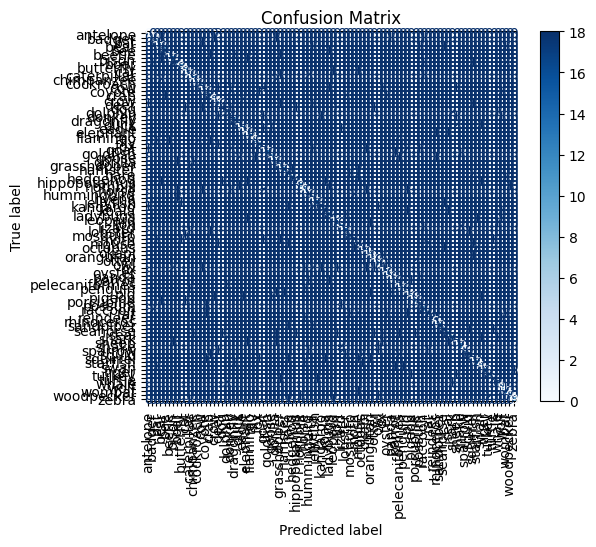

In [26]:
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    ConfusionMatrixDisplay
)
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Evaluate the model
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Step 2: Compute evaluation metrics
# Accuracy
accuracy = accuracy_score(all_labels, all_preds)

# Precision, Recall, and F1-Score for each class
precision = precision_score(all_labels, all_preds, average=None)
recall = recall_score(all_labels, all_preds, average=None)
f1 = f1_score(all_labels, all_preds, average=None)

# Overall metrics
precision_macro = precision_score(all_labels, all_preds, average='macro')
recall_macro = recall_score(all_labels, all_preds, average='macro')
f1_macro = f1_score(all_labels, all_preds, average='macro')

# Classification report
report = classification_report(all_labels, all_preds, target_names=class_names, digits=4)

# Confusion Matrix
conf_matrix = confusion_matrix(all_labels, all_preds)

# Step 3: Print metrics
print("Accuracy:", accuracy)
print("Precision (per class):", precision)
print("Recall (per class):", recall)
print("F1-Score (per class):", f1)
print("Macro Precision:", precision_macro)
print("Macro Recall:", recall_macro)
print("Macro F1-Score:", f1_macro)
print("\nClassification Report:\n", report)

# Step 4: Plot confusion matrix
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=class_names)
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title("Confusion Matrix")
plt.show()

Kode ini bertujuan untuk mengevaluasi kinerja model menggunakan berbagai metrik evaluasi seperti **akurasi**, **presisi**, **recall**, **F1-score**, serta **matriks kebingungannya** dan menampilkan **laporan klasifikasi**. Berikut adalah penjelasan langkah demi langkah dari kode ini:

### 1. **Evaluasi Model pada Set Pengujian**
   - **`model.eval()`**: Mengatur model ke mode evaluasi. Ini memastikan bahwa beberapa layer model yang berperilaku berbeda antara mode pelatihan dan evaluasi (seperti dropout) dimatikan.
   
   - **`with torch.no_grad()`**: Menghindari perhitungan gradien selama evaluasi untuk menghemat memori dan mempercepat proses.
   
   - **Loop melalui `test_loader`**:
     - **`inputs, labels = inputs.to(device), labels.to(device)`**: Memindahkan input dan label ke perangkat yang sesuai (GPU atau CPU).
     - **`outputs = model(inputs)`**: Melakukan prediksi dengan model.
     - **`_, preds = torch.max(outputs, 1)`**: Mengambil prediksi kelas dengan probabilitas tertinggi.
     - **`all_preds.extend(preds.cpu().numpy())`** dan **`all_labels.extend(labels.cpu().numpy())`**: Menyimpan hasil prediksi dan label asli dalam list.

### 2. **Menghitung Metrik Evaluasi**
   - **Akurasi**:
     - **`accuracy_score(all_labels, all_preds)`**: Menghitung akurasi, yaitu persentase prediksi yang benar.
   
   - **Presisi, Recall, dan F1-Score per Kelas**:
     - **`precision_score(all_labels, all_preds, average=None)`**: Menghitung presisi untuk setiap kelas.
     - **`recall_score(all_labels, all_preds, average=None)`**: Menghitung recall untuk setiap kelas.
     - **`f1_score(all_labels, all_preds, average=None)`**: Menghitung F1-score untuk setiap kelas.
   
   - **Metrik Makro (Overall)**:
     - **`precision_score(all_labels, all_preds, average='macro')`**: Menghitung presisi makro, yaitu rata-rata presisi di seluruh kelas.
     - **`recall_score(all_labels, all_preds, average='macro')`**: Menghitung recall makro.
     - **`f1_score(all_labels, all_preds, average='macro')`**: Menghitung F1-score makro.
   
   - **Laporan Klasifikasi**:
     - **`classification_report(all_labels, all_preds, target_names=class_names, digits=4)`**: Menyediakan laporan klasifikasi yang mencakup presisi, recall, F1-score, dan support (jumlah sampel untuk setiap kelas), yang dipresentasikan untuk setiap kelas dengan 4 angka desimal.

   - **Matriks Kebingungannya**:
     - **`confusion_matrix(all_labels, all_preds)`**: Menghitung matriks kebingungannya yang menunjukkan berapa banyak prediksi yang benar dan salah untuk setiap kelas.

### 3. **Mencetak Metrik Evaluasi**
   - **Mencetak Metrik**: Kode ini mencetak hasil evaluasi seperti akurasi, presisi, recall, F1-score per kelas, serta metrik makro untuk memberikan gambaran umum kinerja model pada set pengujian.

### 4. **Plotting Matriks Kebingungan**
   - **`ConfusionMatrixDisplay(conf_matrix, display_labels=class_names)`**: Menggunakan `ConfusionMatrixDisplay` untuk membuat plot dari matriks kebingungannya dengan label kelas yang sesuai.
   
   - **`disp.plot(cmap='Blues', xticks_rotation='vertical')`**: Menampilkan matriks kebingungannya dalam bentuk heatmap dengan skema warna biru dan label sumbu x yang diputar secara vertikal.
   
   - **`plt.show()`**: Menampilkan heatmap dari matriks kebingungannya.

### Hasil yang Diharapkan
Kode ini memberikan informasi mendalam tentang kinerja model pada set pengujian, dengan metrik-metrik seperti:
- **Akurasi**: Persentase prediksi yang benar.
- **Presisi**: Proporsi prediksi positif yang benar untuk setiap kelas.
- **Recall**: Proporsi kelas yang benar yang terdeteksi oleh model.
- **F1-Score**: Harmonic mean dari presisi dan recall, berguna ketika ada ketidakseimbangan kelas.
- **Laporan Klasifikasi**: Metrik per kelas yang lengkap.
- **Matriks Kebingungan**: Visualisasi perbandingan antara label asli dan prediksi model.

### Manfaat
- **Memahami Kinerja Model**: Metrik-metrik ini memberikan gambaran yang lebih lengkap mengenai kemampuan model dalam memprediksi kelas-kelas tertentu.
- **Deteksi Ketidakseimbangan Kelas**: Matriks kebingungannya membantu dalam mendeteksi apakah model kesulitan dalam memprediksi kelas tertentu.
- **Penggunaan Laporan Klasifikasi**: Laporan ini memberikan presisi, recall, dan F1-score yang lebih terperinci, yang sangat berguna terutama pada masalah dengan kelas yang tidak seimbang.



GradCAM

In [27]:
!pip install grad-cam


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 40.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39588 sha256=e804797213d0d030c90bde2258203f512a6ca85768aea85fc111a376acc725b2
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam


In [28]:
print(model.features)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
)


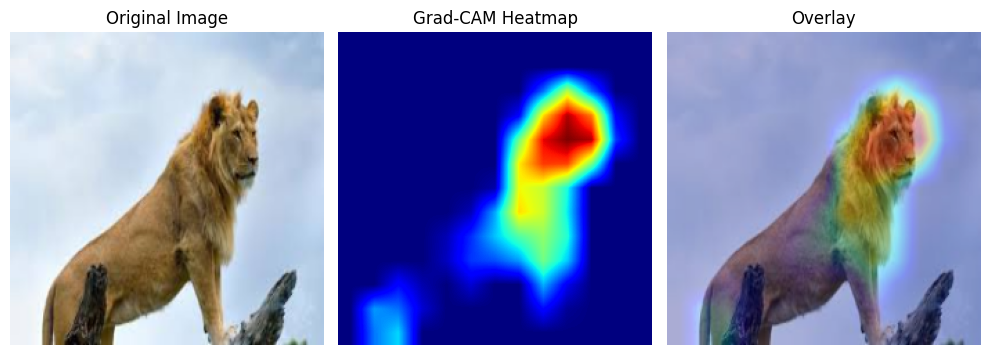

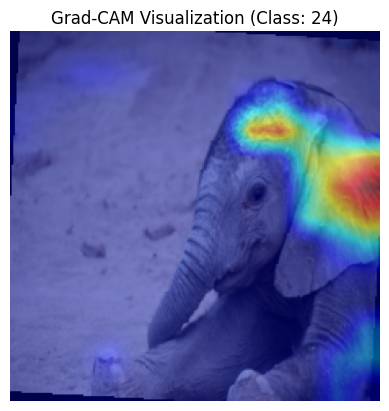

In [42]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Define Grad-CAM
target_layers = [model.features[-3]]  # Use the last convolutional layer
cam = GradCAM(model=model, target_layers=target_layers)

# Select a test image
images, labels = next(iter(test_loader))
image = images[0].unsqueeze(0).to(device)  # Single test image
label = labels[0].item()

# Specify the target class for visualizationimport torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from torchvision import models, transforms

# Grad-CAM implementation for AlexNet
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # Register hooks
        target_layer.register_forward_hook(self.save_activations)
        target_layer.register_backward_hook(self.save_gradients)

    def save_activations(self, module, input, output):
        self.activations = output.detach()

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate_cam(self, input_image, target_class=None):
        self.model.eval()
        input_image = input_image.squeeze(0).to(device)
        input_image = input_image.unsqueeze(0)
        output = self.model(input_image)

        if target_class is None:
            target_class = torch.argmax(output, dim=1).item()

        # Backpropagate to obtain gradients
        self.model.zero_grad()
        target = output[:, target_class]
        target.backward()

        # Compute CAM
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1).squeeze()
        cam = torch.relu(cam)

        # Normalize and resize CAM
        cam = cam.cpu().numpy()
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        cam = cv2.resize(cam, (227, 227))  # Ensure this matches the input size

        return cam

# Function to visualize Grad-CAM
def visualize_gradcam(image_path, cam):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (227, 227))  # Resize to match the heatmap dimensions

    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    overlay = heatmap * 0.4 + img
    overlay = np.uint8(overlay / np.max(overlay) * 255)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='jet')
    plt.title('Grad-CAM Heatmap')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title('Overlay')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    # Device configuration
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Load AlexNet model
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(class_names))  # Adjust to match the number of classes
    model.load_state_dict(torch.load('/kaggle/working/best_animal_model.pth', map_location=device))  # Load weights
    model = model.to(device)

    # Select target layer for Grad-CAM
    target_layer = model.features[10]  # Last convolutional layer in AlexNet

    # Initialize Grad-CAM
    grad_cam = GradCAM(model, target_layer)

    # Load and preprocess test image
    img_path = "/content/animals/animals/lion/5f8df573bf.jpg"  # Replace with your image path
    img = Image.open(img_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((227, 227)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_image = transform(img)

    # Generate Grad-CAM and visualize
    cam = grad_cam.generate_cam(input_image)
    visualize_gradcam(img_path, cam)
targets = [ClassifierOutputTarget(label)]

# Generate CAM
# grayscale_cam = cam(input_tensor=image, targets=targets)[0]  # Targets specify specific classes
# grayscale_cam = grad_cam(input_tensor=image, targets=targets)[0]  # Targets specify specific classes
grayscale_cam = grad_cam.generate_cam(input_image=image, target_class=label)

# Convert tensor image to NumPy and normalize it
image_np = image.cpu().squeeze().permute(1, 2, 0).numpy()  # Convert tensor to NumPy (H, W, C)
image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min())  # Normalize to [0, 1]

# Generate the CAM overlay
cam_image = show_cam_on_image(image_np.astype(np.float32), grayscale_cam, use_rgb=True)

# Visualize
plt.imshow(cam_image)
plt.title(f"Grad-CAM Visualization (Class: {label})")
plt.axis('off')
plt.show()

Kode ini mengimplementasikan **Grad-CAM** (Gradient-weighted Class Activation Mapping) untuk visualisasi bagian-bagian dari gambar yang paling berkontribusi terhadap keputusan model dalam klasifikasi. Grad-CAM digunakan untuk memberikan interpretasi yang lebih jelas tentang bagaimana model membuat prediksi berdasarkan fitur yang relevan di gambar. Berikut adalah penjelasan langkah demi langkah:

### 1. **Inisialisasi Grad-CAM**
   - **GradCAM** adalah kelas yang diimpor dari `pytorch_grad_cam` yang digunakan untuk menghitung dan mengvisualisasikan Grad-CAM pada model.
   - **`target_layers = [model.features[-3]]`**: Menetapkan lapisan target yang digunakan untuk menghitung Grad-CAM. Di sini, digunakan lapisan konvolusional ketiga terakhir (`model.features[-3]`), yang sering kali merupakan lapisan yang lebih dalam yang menangkap fitur yang lebih kompleks.
   - **`cam = GradCAM(model=model, target_layers=target_layers)`**: Inisialisasi objek Grad-CAM dengan model dan lapisan target yang telah dipilih.

### 2. **Pemilihan Gambar Uji**
   - **`images, labels = next(iter(test_loader))`**: Mengambil satu batch gambar dan label dari loader data pengujian.
   - **`image = images[0].unsqueeze(0).to(device)`**: Memilih gambar pertama dari batch, menambah dimensi untuk memasukkannya ke dalam batch (karena Grad-CAM memerlukan batch sebagai input), dan memindahkannya ke perangkat (CPU atau GPU).
   - **`label = labels[0].item()`**: Mengambil label untuk gambar tersebut.

### 3. **Menghitung Grad-CAM**
   - **`GradCAM.generate_cam(input_image, target_class=None)`**: Fungsi ini menghitung Grad-CAM untuk gambar input tertentu. Jika `target_class` tidak diberikan, Grad-CAM akan dihitung untuk kelas dengan probabilitas tertinggi pada output model.
   - **Backpropagation**: Untuk menghasilkan Grad-CAM, kode melakukan backpropagation dengan target adalah kelas yang dipilih, dan menghitung gradien dari output model terhadap aktivasi dari lapisan konvolusional target.
   - **`weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)`**: Menghitung rata-rata gradien untuk menghasilkan bobot untuk aktivasi.
   - **`cam = torch.sum(weights * self.activations, dim=1).squeeze()`**: Membuat peta aktivasi (CAM) dengan mengalikan bobot gradien dengan aktivasi.

### 4. **Menampilkan Grad-CAM**
   - **`visualize_gradcam(image_path, cam)`**: Fungsi ini bertanggung jawab untuk memvisualisasikan gambar asli, heatmap Grad-CAM, dan overlay (gabungan heatmap dengan gambar asli) secara berdampingan.
   - **`cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)`**: Menerapkan colormap `JET` pada Grad-CAM untuk menghasilkan heatmap warna.
   - **Overlay Heatmap pada Gambar**: Heatmap ditambahkan ke gambar asli dengan transparansi (`0.4`), sehingga bagian yang lebih penting dapat terlihat jelas.

### 5. **Menggunakan Grad-CAM untuk Visualisasi pada Gambar Uji**
   - **`input_image = transform(img)`**: Menggunakan transformasi untuk mengubah gambar asli menjadi tensor yang sesuai dengan format input model (ukuran dan normalisasi).
   - **`grayscale_cam = grad_cam.generate_cam(input_image, target_class=label)`**: Menghasilkan peta aktivasi Grad-CAM untuk kelas yang ditentukan (dalam hal ini, kelas yang benar).
   - **`show_cam_on_image(image_np.astype(np.float32), grayscale_cam, use_rgb=True)`**: Menampilkan overlay Grad-CAM pada gambar dengan menggunakan `show_cam_on_image`.

### 6. **Visualisasi**
   - **`plt.imshow(cam_image)`**: Menampilkan gambar dengan overlay Grad-CAM.
   - **`plt.title(f"Grad-CAM Visualization (Class: {label})")`**: Menambahkan judul pada plot, yang menunjukkan kelas prediksi pada gambar.
   - **`plt.axis('off')`**: Menghilangkan sumbu agar hanya gambar yang terlihat.

### Hasil yang Diharapkan
- **Visualisasi Grad-CAM**: Gambar akan ditampilkan dalam tiga bagian: gambar asli, heatmap Grad-CAM, dan overlay antara gambar asli dan heatmap. Ini menunjukkan area dalam gambar yang paling berpengaruh terhadap prediksi model.
- **Interpretasi Model**: Dengan melihat area yang disorot oleh Grad-CAM, kita dapat lebih memahami mengapa model memutuskan kelas tertentu, sehingga membantu menjelaskan keputusan model secara lebih transparan.

### Manfaat
- **Interpretasi Model**: Grad-CAM memberikan pemahaman yang lebih dalam tentang bagaimana model pengenalan gambar membuat keputusan berdasarkan fitur-fitur visual yang relevan.
- **Debugging dan Perbaikan Model**: Jika Grad-CAM menunjukkan bahwa model fokus pada area yang tidak relevan atau tidak semestinya, ini bisa menjadi petunjuk untuk meningkatkan pelatihan atau arsitektur model.
